In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
%matplotlib inline
#%matplotlib interactive

In [4]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [5]:
import json

file = "../.data/raw/embeddings_generated_comments_slack_256.jsonl"
with open(file) as f:
    data_raw = [json.loads(line) for line in f]

In [6]:
import pandas as pd

df_raw = pd.DataFrame(data_raw)
df_raw

,contract_name,file_path,contract_address,language,class_name,class_code,class_documentation,class_documentation_type,func_name,func_code,...,output,generated,target,truncated,duration,bleu_score,generated_pooled_avg,generated_pooled_max,func_code_pooled_avg,func_code_pooled_max
0,TheCoinBBToken,TheCoinBBToken.sol,0x9d365b5dad49b4277aa444e523c5cc789d3f6959,Solidity,TheCoinBBToken,contract TheCoinBBToken {\r\n //币名字\r\n ...,,,TheCoinBBToken,"function TheCoinBBToken(uint256 initialSupply,...",...,/* Constructor */\r\n function ERC20Token(s...,"\r\n function ERC20Token(string _name, stri...","function TheCoinBBToken(uint256 initialSupply,...",False,7.300967,1.397416e-231,"[0.18231993913650513, 0.22477486729621887, 0.6...","[2.4258086681365967, 2.93768048286438, 2.80093...","[0.7295137047767639, 0.38593432307243347, 0.01...","[5.402975082397461, 2.5263583660125732, 4.1556..."
1,Keep3rV1,Keep3rV1.sol,0x5bab9eec479b1991455a89562a2cc7c274c5f95e,Solidity,Keep3rV1,contract Keep3rV1 is ReentrancyGuard {\r\n ...,,,isBondedKeeper,"function isBondedKeeper(address keeper, addres...",...,/**\r\n * @notice confirms if the current keep...,"\r\n function isMinKeeper(address keeper, a...","function isBondedKeeper(address keeper, addres...",False,6.953809,8.447944e-01,"[0.28921324014663696, 0.5198975205421448, 0.89...","[4.014957427978516, 3.8795106410980225, 5.3767...","[0.09057445824146271, 0.20432017743587494, 0.7...","[4.374789714813232, 3.376408338546753, 5.30213..."
2,Cellpinda,Cellpinda.sol,0x5f4a339fd4c64f8bb34935efa7a638b92ae82e9a,Solidity,SafeMath,library SafeMath {\r\n\r\n /**\r\n * @dev Mu...,/**\r\n * @title SafeMath\r\n * @dev Math oper...,NatSpecMultiLine,div,"function div(uint256 a, uint256 b) internal pu...",...,/**\r\n * @dev Integer division of two numbers...,"\r\nfunction div(uint256 a, uint256 b) interna...","function div(uint256 a, uint256 b) internal pu...",False,3.792178,9.139438e-01,"[0.007728193886578083, 0.37208354473114014, -0...","[2.3015894889831543, 3.829735279083252, 3.3693...","[-0.08193076401948929, 0.2569873631000519, -0....","[2.4103784561157227, 2.8426284790039062, 3.375..."
3,Tccchain,Tccchain.sol,0x91507ea472707e6587f359e0f71846ec097aefc7,Solidity,Tccchain,contract Tccchain {\r\n // Public variables...,,,_transfer,"function _transfer(address _from, address _to,...",...,"/**\r\n * Internal transfer, only can be calle...","\r\n \r\nfunction _transfer(address _from, add...","function _transfer(address _from, address _to,...",False,14.390161,9.474258e-01,"[0.450160950422287, 0.2462613582611084, 0.2296...","[3.338660955429077, 3.0911128520965576, 4.4330...","[0.5586769580841064, -0.056083500385284424, 0....","[3.369008779525757, 3.1738884449005127, 4.3181..."
4,ELB1,ELB1.sol,0x109e726df6f2fe1aaf0ca306e1582d305614075b,Solidity,IERC20,interface IERC20 {\r\n //function transfer(...,,,totalSupply,function totalSupply() external view returns (...,...,"//function transfer(address to, uint256 value)...","\n//event Transfer(address indexed from, addre...",function totalSupply() external view returns (...,False,6.811126,0.000000e+00,"[0.4172349274158478, 0.8019665479660034, -0.07...","[4.429458141326904, 3.211848735809326, 2.63131...","[1.1170274019241333, 0.35891929268836975, 0.02...","[2.195232391357422, 1.2374753952026367, 1.2371..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,DerpDAO,DerpDAO.sol,0x861c840d1cc29d90d84f6c18d1ee6ec372461055,Solidity,SafeCast,library SafeCast {\r\n /**\r\n *...,/**\r\n * @dev Wrappers over Solidity's uintXX...,NatSpecMultiLine,toUint128,function toUint128(uint256 value) internal pur...,...,/**\r\n * @dev Returns the downcasted uint128 ...,\r\nfunction toUint128(uint256 value) internal...,function toUint128(uint256 value) internal pur...,False,2.388531,5.915464e-01,"[-0.04910701513290405, -0.34202733635902405, 0...","[2.2722420692443848, 2.0409727096557617, 4.711...","[-0.26368406414985657, -0.1918938010931015, 0....","[2.272425651550293, 2.

In [7]:
df_raw = df_raw.drop_duplicates(subset=['func_documentation'])

In [8]:
import numpy as np
X = np.stack(df_raw["generated_pooled_avg"])

# Dimensionality reduction

In [9]:
cache_dir = "../.data/cache"

In [10]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

pipeline = Pipeline([
#    ('scaling', StandardScaler()),
    ('pca', PCA(n_components=50, random_state=42)),
    ('tsne', TSNE(n_components=2, verbose=2, random_state=42, perplexity=25, n_iter=5000))
    ], memory=cache_dir, verbose=True)

pipeline.fit(X)

[t-SNE] Computing 76 nearest neighbors...
[t-SNE] Indexed 4695 samples in 0.000s...
[t-SNE] Computed neighbors for 4695 samples in 0.394s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4695
[t-SNE] Computed conditional probabilities for sample 2000 / 4695
[t-SNE] Computed conditional probabilities for sample 3000 / 4695
[t-SNE] Computed conditional probabilities for sample 4000 / 4695
[t-SNE] Computed conditional probabilities for sample 4695 / 4695
[t-SNE] Mean sigma: 3.881634
[t-SNE] Computed conditional probabilities in 0.054s
[t-SNE] Iteration 50: error = 88.3949051, gradient norm = 0.0160007 (50 iterations in 0.968s)
[t-SNE] Iteration 100: error = 86.7258530, gradient norm = 0.0024272 (50 iterations in 0.631s)
[t-SNE] Iteration 150: error = 86.5277481, gradient norm = 0.0008205 (50 iterations in 0.625s)
[t-SNE] Iteration 200: error = 86.5048523, gradient norm = 0.0004920 (50 iterations in 0.574s)
[t-SNE] Iteration 250: error = 86.4978409, gradient norm = 0.0003394

Pipeline(memory='../.data/cache',
         steps=[('pca', PCA(n_components=50, random_state=42)),
                ('tsne',
                 TSNE(n_iter=5000, perplexity=25, random_state=42, verbose=2))],
         verbose=True)

In [11]:
#get values from pipeline:
pca = pipeline.named_steps['pca']
pca_data = pca.transform(X)
pca_data

array([[ 4.83418248,  2.99884055, -1.13627013, ..., -0.45875304,
         1.24563606, -2.09552193],
       [ 6.06620823,  7.35529955,  1.82495148, ...,  4.13528774,
        -3.66934521, -2.23810571],
       [-4.50192549,  4.04225117, -7.92896873, ..., -2.10818359,
        -0.07625631, -0.61978403],
       ...,
       [ 5.59154729,  2.45982986,  3.58751658, ..., -0.59120556,
         0.99507429, -2.58222193],
       [-1.11178611, -0.33287563,  3.88771888, ...,  1.38714426,
         1.49683809,  0.67421039],
       [ 0.86442791, -1.62727532,  2.36449703, ..., -1.16163124,
         0.06444665,  0.17390521]])

Text(0.5, 1.0, 'PCA')

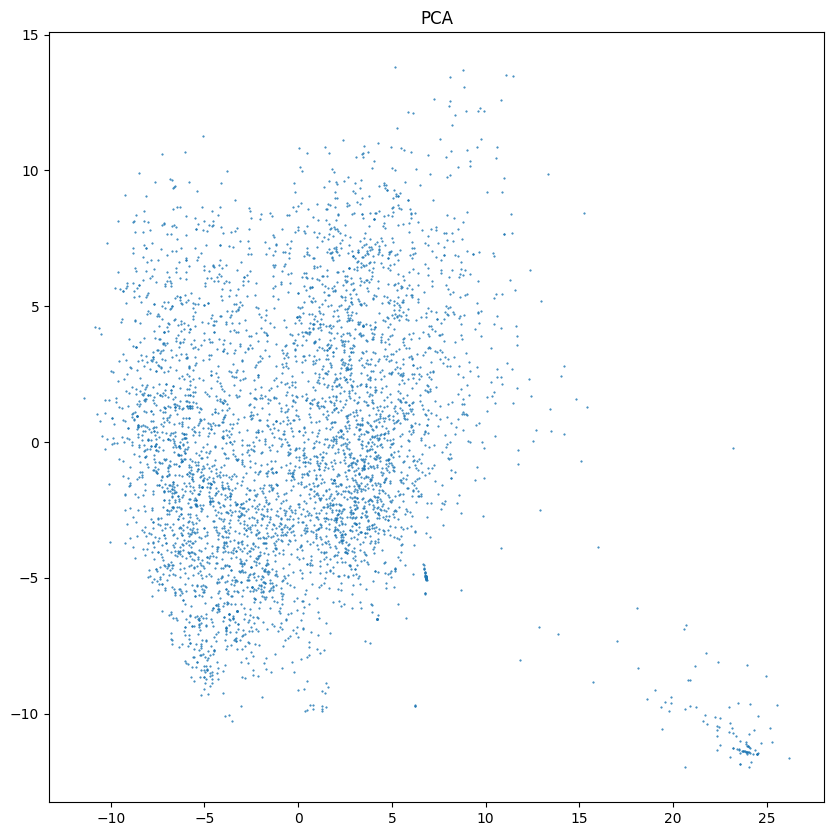

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure( figsize=(10, 10),)

ax = fig.gca()


ax.scatter( x=pca_data[:,0], y=pca_data[:,1], alpha=1, marker='.', s=1)
ax.set_title('PCA')

In [13]:
#import numpy as np
#from torch.utils.tensorboard import SummaryWriter
#
#vectors = X
#metadata = df["func_documentation"].values # labels
#writer = SummaryWriter()
#writer.add_embedding(vectors, metadata)
#writer.close()

In [14]:
tsne = pipeline.named_steps['tsne']
tsne_data = tsne.embedding_
tsne_data

array([[-31.544535  , -26.042294  ],
       [  9.964799  ,  -2.0828905 ],
       [-65.05679   ,  90.603676  ],
       ...,
       [ -7.732256  ,  -0.15154685],
       [ 63.53174   ,  17.542362  ],
       [ 60.557957  , -25.758726  ]], dtype=float32)

Text(0.5, 1.0, 'T-SNE + PCA')

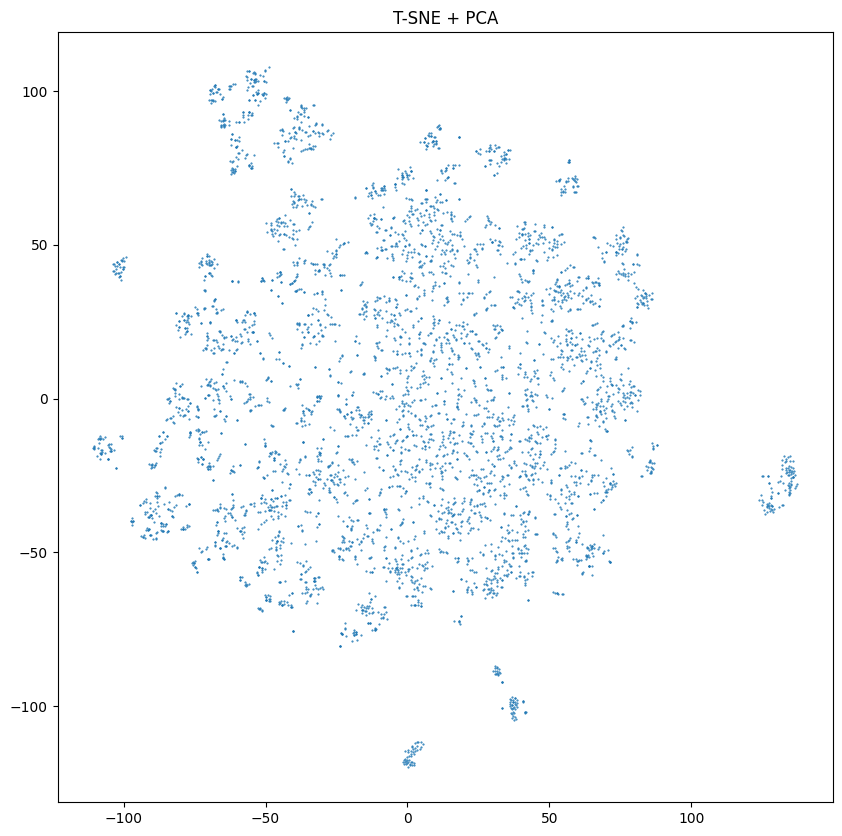

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure( figsize=(10, 10),)

ax = fig.gca()


ax.scatter( x=tsne_data[:,0], y=tsne_data[:,1], alpha=1, marker='.', s=1)
ax.set_title('T-SNE + PCA')


# Clustering

In [16]:
import time
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import product
import matplotlib.gridspec as gridspec

plot_kwds = {'alpha': 1, 'marker': '.', 's': 10, 'linewidths': 0}

def plot_clusters(data, algorithm, hyperparameters, sort_by_cluster_size=False, num_cols=1, scale=6, args=()):
    param_names = list(hyperparameters.keys())
    num_params = len(param_names)
    combinations = list(product(*hyperparameters.values()))
    num_combinations = len(combinations)
    
    if sort_by_cluster_size:
        cluster_sizes = []  # List to store cluster sizes
        
        for i, param_values in enumerate(combinations):
            params = dict(zip(param_names, param_values))
            labels = algorithm(**params).fit_predict(data)
            num_clusters = len(np.unique(labels))
            cluster_sizes.append(num_clusters)
        
        # Sort combinations and cluster sizes in descending order of cluster sizes
        sorted_indices = np.argsort(cluster_sizes)[::-1]
        sorted_combinations = [combinations[i] for i in sorted_indices]
    else:
        sorted_combinations = combinations

    num_rows = (num_combinations + num_cols - 1) // num_cols  # Calculate the number of rows needed
    
    # Calculate the figure size based on the number of rows and columns
    fig_width = scale * num_cols
    fig_height = scale * num_rows
    
    fig = plt.figure(figsize=(fig_width, fig_height))
    #fig.suptitle(f'{algorithm.__name__} - Hyperparameter Grid')
    
    gs = gridspec.GridSpec(num_rows, num_cols, figure=fig)  # Use GridSpec to define the grid
    
    for i, param_values in enumerate(sorted_combinations):
        params = dict(zip(param_names, param_values))
        start_time = time.time()
        labels = algorithm(*args, **params).fit_predict(data)
        end_time = time.time()
        
        num_clusters = len(np.unique(labels))

        palette = sns.color_palette('deep', num_clusters)
        colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
        
        ax = fig.add_subplot(gs[i // num_cols, i % num_cols])  # Use GridSpec to position the subplot
        ax.scatter(data.T[0], data.T[1], c=colors, **plot_kwds)
        ax.set_title(f'Hyperparameters: {params}')
        ax.set_xlabel('X')
        ax.set_ylabel('Y')

        # add total number of clusters
        ax.text(
            0.97,
            0.06,
            f'Clusters: {num_clusters}',
            verticalalignment='bottom',
            horizontalalignment='right',
            transform=ax.transAxes,
            fontsize=8,
        )

        ax.text(
            0.97,
            0.02,
            f'Clustering took: {end_time - start_time:.2f}s',
            verticalalignment='bottom',
            horizontalalignment='right',
            transform=ax.transAxes,
            fontsize=8,
        )
    
    plt.tight_layout()
    plt.show()


## Parameter Search

### DBSCAN

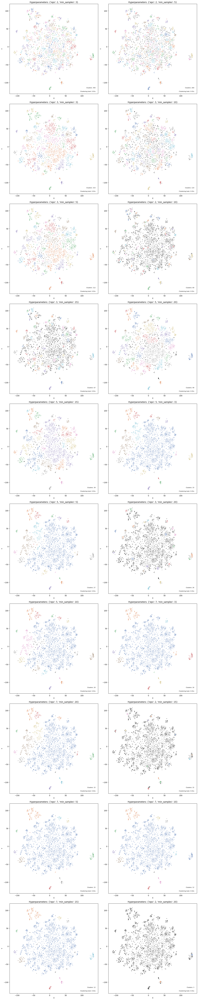

In [17]:
from sklearn.cluster import DBSCAN

# Example usage
algorithm = DBSCAN  # Clustering algorithm

hyperparameters = {
    #'eps': [20, 50, 100],  # Hyperparameter 1
    'eps': [2,3, 5, 7],  # Hyperparameter 1
    #'min_samples': [5, 10, 20],  # Hyperparameter 2
    'min_samples': [3, 5, 10, 20, 15],  # Hyperparameter 2
   # 'leaf_size': [10, 20],  # Hyperparameter 3
}

plot_clusters(pipeline.named_steps['tsne'].embedding_, algorithm, hyperparameters, num_cols=2, scale=8, sort_by_cluster_size=True)


### HDBSCAN

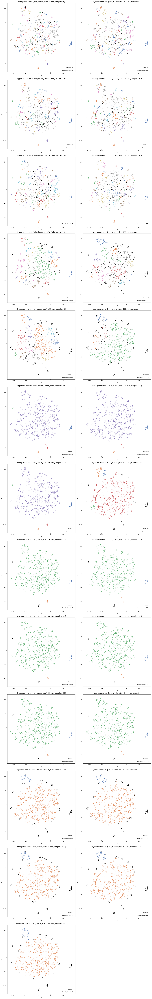

In [18]:
from hdbscan import HDBSCAN
algorithm = HDBSCAN  # Example clustering algorithm

hyperparameters = {
    'min_cluster_size': [5, 10, 20, 50, 100],  # Hyperparameter 1
    'min_samples': [5, 10, 20, 50, 100],  # Hyperparameter 2
}

plot_clusters(pipeline.named_steps['tsne'].embedding_, algorithm, hyperparameters, num_cols=2, scale=8, sort_by_cluster_size=True)


### KMeans

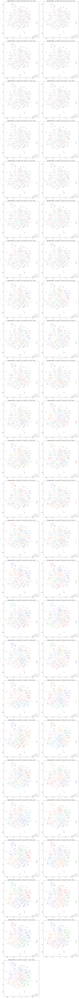

In [19]:
from sklearn.cluster import KMeans
algorithm = KMeans  # Clustering algorithm

hyperparameters = {
    'n_clusters': [5, 10, 20, 50, 100, 250, 500],  # Hyperparameter 1
    'max_iter': [5, 10, 20, 50, 100, 250, 500],  # Hyperparameter 2
    'n_init': ["auto"]
}

plot_clusters(pipeline.named_steps['tsne'].embedding_, algorithm, hyperparameters, num_cols=2, scale=8, sort_by_cluster_size=True)


## Main clustering

In [20]:
from sklearn.cluster import DBSCAN

# cluster each parent cluster

parent = DBSCAN(eps=3, min_samples=5)

parent_labels = parent.fit_predict(pipeline.named_steps['tsne'].embedding_)

In [21]:
df_raw.index

Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
       ...
       9963, 9964, 9968, 9974, 9980, 9982, 9989, 9990, 9992, 9996],
      dtype='int64', length=4695)

In [22]:
import pandas as pd
index = pd.Index(df_raw.index, name='index')
df = pd.DataFrame(pipeline.named_steps['tsne'].embedding_, columns=['x', 'y'], index=df_raw.index,)
df['cluster'] = parent_labels
clusters = df.groupby('cluster', as_index=False, group_keys=True)


In [23]:
def cluster_sub_clusters(cluster):
    if cluster.name == -1:
        print("Skipping noise cluster")
        cluster["sub_cluster"] = -1
        return cluster

    #if cluster.name == -1:
    #    print("Skipping noise cluster")
    #    return
    
    algorithm = DBSCAN(eps=2, min_samples=5)
    sub_clusters = algorithm.fit(cluster[['x','y']].to_numpy())
    cluster["sub_cluster"] = sub_clusters.labels_.tolist()
    return cluster

clusters = clusters.apply(cluster_sub_clusters)

clusters



Skipping noise cluster


x          y  cluster  sub_cluster
0   51     18.074055  84.962029       -1           -1
    105   -33.772377  57.333961       -1           -1
    121    80.987694  46.827507       -1           -1
    160  -102.636673 -22.635706       -1           -1
    172    24.722572  -5.121561       -1           -1
...              ...        ...      ...          ...
111 1143  -65.354172   8.034706      110           -1
    4773  -65.395027   7.960525      110           -1
    6775  -63.723263  11.950310      110           -1
    9556  -64.828697   9.489390      110           -1
    9720  -63.803532  11.795185      110           -1

[4695 rows x 4 columns]

In [24]:
clusters = clusters.reset_index(level=0, drop=True)


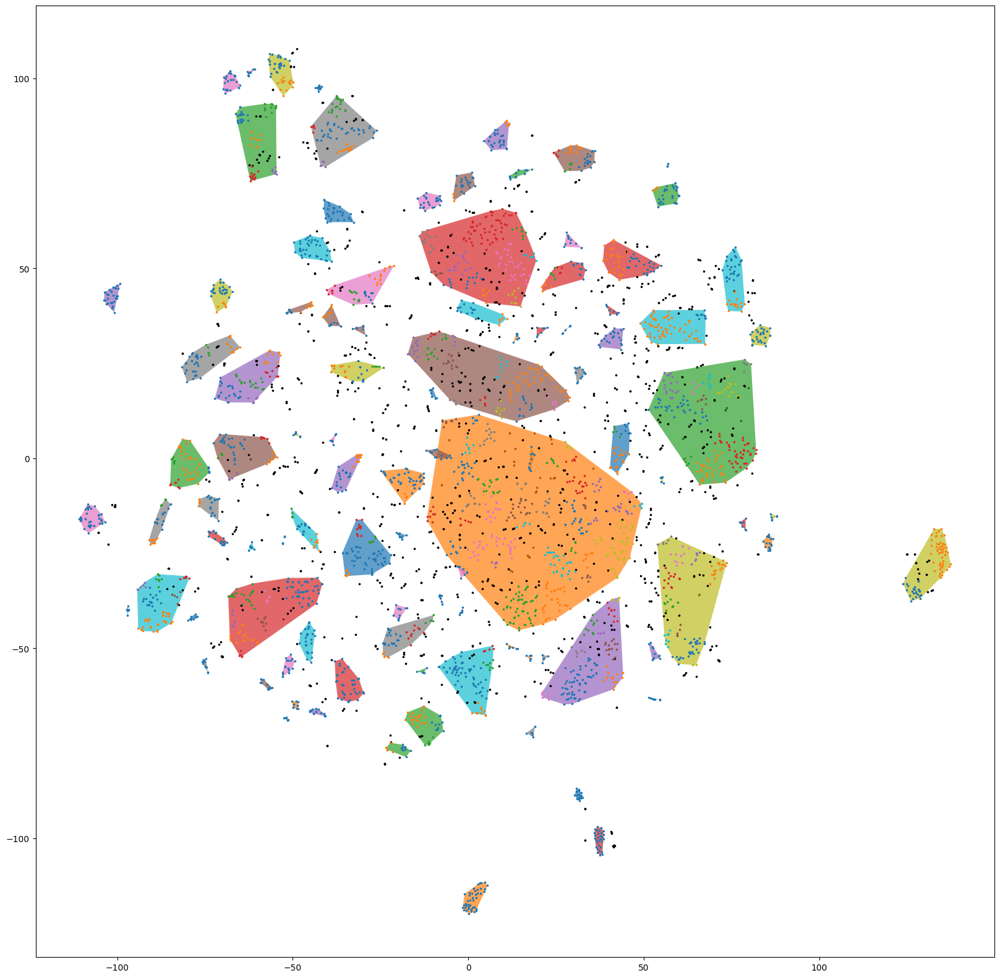

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull


fig, ax = plt.subplots(figsize=(20, 20))

# make kde plot for each cluster
i = 0
for label, cluster in clusters.groupby('cluster'):
    #if len(cluster) > 100:
    #    continue

    #if i > 15:
    #    break

    if label != -1:
        #sns.kdeplot(data=cluster, x='x', y='y', fill=True, ax=ax, label=label, alpha=0.7, warn_singular=False, thresh=0.005, levels=2)
        filtered = cluster[cluster['sub_cluster'] > -1]
        if filtered.empty:
            continue
        hull = ConvexHull(filtered[['x', 'y']].to_numpy(), qhull_options='QJ')
        ax.fill(filtered['x'].iloc[hull.vertices], filtered['y'].iloc[hull.vertices], alpha=0.7)


        # Generate a unique color for each sub-cluster
        num_sub_clusters = len(cluster.groupby('sub_cluster'))
        colors = sns.color_palette('tab10', n_colors=num_sub_clusters)

    for sub_label, sub_cluster in cluster.groupby('sub_cluster'):
        if sub_label != -1:
            # Scatter plot for each sub-cluster with its corresponding color
            ax.scatter(sub_cluster['x'], sub_cluster['y'], color=colors[sub_label], label=sub_label, alpha=1, marker='.', s=10)
        else:
            ax.scatter(sub_cluster['x'], sub_cluster['y'], color='black', label=sub_label, alpha=1, marker='.', s=10)    
    i += 1

plt.show()


In [27]:
res = clusters.join(df_raw)
res.to_pickle("generated_unique_average.pkl")

In [28]:
res

,x,y,cluster,sub_cluster,contract_name,file_path,contract_address,language,class_name,class_code,...,output,generated,target,truncated,duration,bleu_score,generated_pooled_avg,generated_pooled_max,func_code_pooled_avg,func_code_pooled_max
51,18.074055,84.962029,-1,-1,MIGHTYDUCK,MIGHTYDUCK.sol,0x7230153aaaf0b862300c703b5bfbfd31b2a011a8,Solidity,DeflationaryERC20,"contract DeflationaryERC20 is Context, IERC20,...",...,/**\r\n * @dev Sets {decimals} to a value othe...,\r\nfunction _setupDecimals(uint8 decimals_) i...,function _setupDecimals(uint8 decimals_) inter...,False,1.648322,7.652059e-01,"[0.013775269500911236, 0.5122396349906921, 0.6...","[1.4856846332550049, 2.743802309036255, 3.1229...","[0.04140302166342735, 0.649508535861969, 0.648...","[1.7323611974716187, 2.5115532875061035, 2.834..."
105,-33.772377,57.333961,-1,-1,LazyLionsBungalows,@openzeppelin/contracts/utils/structs/BitMaps.sol,0xd80eef7484c8fab1912a43e44a97774093007ab1,Solidity,BitMaps,library BitMaps {\r\n struct BitMap {\r\n ...,...,/**\r\n * @dev Sets the bit at `index` to the ...,\r\n \r\nfunction _setBit(uint256 index) inter...,"function setTo(\r\n BitMap storage bitmap,\...",False,1.860656,4.166229e-232,"[0.2112981528043747, 0.45469415187835693, 0.18...","[2.0616884231567383, 2.4613897800445557, 2.366...","[0.43899932503700256, 0.2973025441169739, 0.67...","[3.057584285736084, 2.7178144454956055, 3.5200..."
121,80.987694,46.827507,-1,-1,MICROBIT,MICROBIT.sol,0xff5ff98f22dc68bed6f34002ee602276d9f2dd08,Solidity,Ownable,contract Ownable is Context {\r\n address p...,...,//Unlocks the contract for owner when _lockTim...,\r\n function unlock() public virtual {\r\n...,function unlock() public virtual {\r\n requ...,False,4.969357,7.719887e-01,"[0.35633930563926697, -0.1663520485162735, -0....","[2.9874989986419678, 2.4917492866516113, 3.583...","[0.534652054309845, -0.2787989675998688, -0.16...","[3.129768133163452, 3.321221351623535, 3.36927..."
160,-102.636673,-22.635706,-1,-1,SentosaX,SentosaX.sol,0xfe030ae14a20b69e0acca54311ef179e189e50b7,Solidity,Token,contract Token {\r\n\r\n /// @return total ...,...,/// @notice `msg.sender` approves `_addr` to s...,"\nfunction approve(address _spender, uint256 _...","function approve(address _spender, uint256 _va...",False,0.938976,1.000000e+00,"[1.3244379758834839, 0.32280561327934265, 0.17...","[3.2309646606445312, 1.5407110452651978, 1.528...","[1.4337133169174194, 0.3007834255695343, 0.095...","[2.679309844970703, 1.504692792892456, 1.53836..."
172,24.722572,-5.121561,-1,-1,GuardianManager,GuardianManager.sol,0x63e6317b5d4e3e044105348c3d2c1fbbe7b776dd,Solidity,GuardianManager,contract GuardianManager is BaseFeature {\n\n ...,...,/**\n * @inheritdoc IFeature\n */\nfunction ge...,\nfunction getRequiredSignatures(address _wall...,function getRequiredSignatures(address _wallet...,False,12.571132,4.266220e-02,"[0.11111737042665482, 0.42251357436180115, 0.3...","[4.31832218170166, 2.894057273864746, 4.432549...","[0.875288188457489, 0.39046579599380493, 0.809...","[5.242012977600098, 2.761845588684082, 3.38071..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1143,-65.354172,8.034706,110,-1,PermissionedTokenMetadataRegistry,contracts/ERC1155.sol,0xb26c0dd52e383cff6ee0680b210fe057c86bcd0e,Solidity,ERC1155,"contract ERC1155 is\n IERC1155,\n MixinN...",...,/// @notice Get the balance of an account's To...,"\n\nfunction balanceOf(address owner, uint256 ...","function balanceOf(address owner, uint256 id) ...",False,3.542734,1.398737e-01,"[0.5389630198478699, -0.4265326261520386, 0.51...","[3.381293296813965, 2.7419726848602295, 3.5556...","[0.6272811889648438, -0.14346176385879517, 0.8...","[2.4394686222076416, 1.9233317375183105, 3.413..."
4773,-65.395027,7.960525,110,-1,Flasher,contracts/FujiERC1155/FujiBaseERC1155.sol,0x54f72175c40c3f4857b18fe539a85ddb92f6d985,Solidity,FujiBaseERC1155,"contract FujiBaseERC1155 is IERC1155, ERC165, ...",...,/**\n * @dev See {IERC1155-balanceOf}.\n * R